In [17]:
import os

if os.getcwd().endswith("notebooks"):
    os.chdir("..")

print("Directorio actual:", os.getcwd())


Directorio actual: C:\ML\spaceflights


In [18]:
from kedro.framework.project import configure_project
from kedro.framework.session import KedroSession

configure_project("spaceflights")

# Creacióm de la sesion en kredrooo
session = KedroSession.create()
context = session.load_context()
catalog = context.catalog

[10/23/25 09:18:17] INFO     Kedro is sending anonymous usage data with the sole purpose of improving ]8;id=753506;file://C:\ML\spaceflights\.venv\Lib\site-packages\kedro_telemetry\plugin.py\plugin.py]8;;\:]8;id=464289;file://C:\ML\spaceflights\.venv\Lib\site-packages\kedro_telemetry\plugin.py#243\243]8;;\
                             the product. No personal data or IP addresses are stored on our side. To              
                             opt out, set the `KEDRO_DISABLE_TELEMETRY` or `DO_NOT_TRACK` environment              
                             variables, or create a `.telemetry` file in the current working                       
                             directory with the contents `consent: false`. To hide this message,                   
                             explicitly grant or deny consent. Read more at                                        
                             https://docs.kedro.org/en/stable/configuration/telemetry.html                         

In [19]:
df = catalog.load("model_input_table")
pca_df = catalog.load("pca_features")

[10/23/25 09:18:20] INFO     Loading data from model_input_table (ParquetDataset)...            ]8;id=591026;file://C:\ML\spaceflights\.venv\Lib\site-packages\kedro\io\data_catalog.py\data_catalog.py]8;;\:]8;id=894084;file://C:\ML\spaceflights\.venv\Lib\site-packages\kedro\io\data_catalog.py#403\403]8;;\

                    INFO     Loading data from pca_features (ParquetDataset)...                 ]8;id=179246;file://C:\ML\spaceflights\.venv\Lib\site-packages\kedro\io\data_catalog.py\data_catalog.py]8;;\:]8;id=501578;file://C:\ML\spaceflights\.venv\Lib\site-packages\kedro\io\data_catalog.py#403\403]8;;\

In [20]:
#Un checkeoo de los unass cosas y la salida
df = catalog.load("model_input_table")
pca_df = catalog.load("pca_features")
report = catalog.load("pca_kmeans_report")

print(df.shape, pca_df.shape)
display(pca_df.head())
display(report.head())


[10/23/25 09:18:26] INFO     Loading data from model_input_table (ParquetDataset)...            ]8;id=698616;file://C:\ML\spaceflights\.venv\Lib\site-packages\kedro\io\data_catalog.py\data_catalog.py]8;;\:]8;id=194231;file://C:\ML\spaceflights\.venv\Lib\site-packages\kedro\io\data_catalog.py#403\403]8;;\

                    INFO     Loading data from pca_features (ParquetDataset)...                 ]8;id=678490;file://C:\ML\spaceflights\.venv\Lib\site-packages\kedro\io\data_catalog.py\data_catalog.py]8;;\:]8;id=859976;file://C:\ML\spaceflights\.venv\Lib\site-packages\kedro\io\data_catalog.py#403\403]8;;\

                    INFO     Loading data from pca_kmeans_report (CSVDataset)...                ]8;id=521178;file://C:\ML\spaceflights\.venv\Lib\site-packages\kedro\io\data_catalog.py\data_catalog.py]8;;\:]8;id=520258;file://C:\ML\spaceflights\.venv\Lib\site-packages\kedro\io\data_catalog.py#403\403]8;;\

(90836, 19) (33991, 3)


,pca_1,pca_2,cluster
0,3.885309,0.074420,1
1,1.284377,0.061333,1
3,-1.672744,0.695935,0
8,1.580213,-0.477960,1
14,0.194080,0.990702,0


,cluster,pca_1,pca_2
0,0,-1.193804,0.176985
1,1,1.952987,-0.607002
2,2,6.365698,13.234533


In [6]:
pca_df["cluster"].value_counts().sort_index().to_frame("n_muestras")

,n_muestras
cluster,
0,21480
1,12237
2,274


In [11]:
import pandas as pd
import plotly.express as px

# COlumnas para mostrar en el hover
hover_cols = [c for c in [
    "absolute_magnitude", "diameter_mean", "relative_velocity",
    "miss_distance", "year", "hazardous", "sentry_object", "orbiting_body"
] if c in df.columns]

# Unificación de datos en HOVER
plot_df = pca_df.join(df[hover_cols], how="left").copy()

#Arreglar columnas para Plotly
for c in hover_cols:
    # pasar el cosas a tipo nativoo
    if str(plot_df[c].dtype) in ("Int64", "UInt8", "Int8", "UInt16", "Int16", "boolean"):
        plot_df[c] = plot_df[c].astype(float)

    #reemplazar unas cosas para q json sea seriable
        plot_df[c] = plot_df[c].where(plot_df[c].notna(), None)


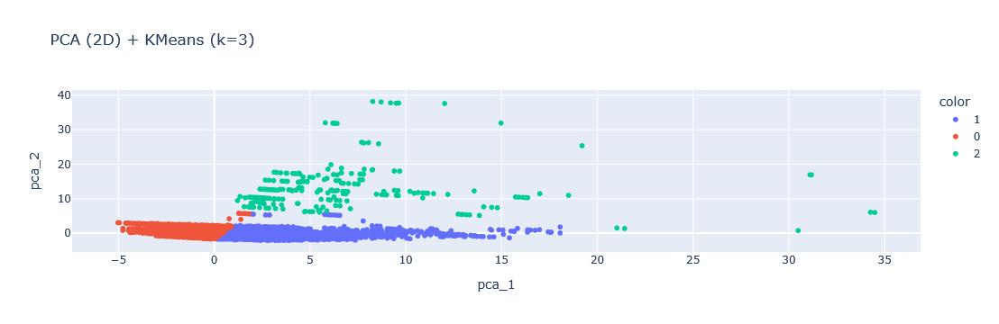

Gráfico guardado en: data/08_reporting/pca_kmeans_clusters.html


In [14]:
# GRAFICO BONITO
fig = px.scatter(
    plot_df,
    x="pca_1", y="pca_2",
    color=plot_df["cluster"].astype(str),
    hover_data=hover_cols,
    title="PCA (2D) + KMeans (k=3)"
)

fig.show()

#guardar el gráfico en el 08!
fig.write_html("../data/08_reporting/pca_kmeans_clusters.html")
print("Gráfico guardado en: data/08_reporting/pca_kmeans_clusters.html")

In [26]:
import os, pandas as pd

# voya verificar de donde corre el cod pq no fucniona!!S:
print("cwd:", os.getcwd())

# lectura de tabla chavos
df = pd.read_csv("data/07_model_output/eval_metrics.csv")

#TOP10
display(df.sort_values("f1", ascending=False).head(10))

#por si no se creó mi archivo:(
out_path = "data/08_reporting/clf_results_table.csv"
os.makedirs(os.path.dirname(out_path), exist_ok=True)
df.to_csv(out_path, index=False)
print("Guardado:", out_path)



cwd: C:\ML\spaceflights


,f1,recall,precision,roc_auc
0,0.468433,0.940045,0.311937,0.883436


Guardado: data/08_reporting/clf_results_table.csv


In [27]:
import pandas as pd
df = pd.read_csv("data/08_reporting/clf_results_table.csv")
display(df.sort_values("f1", ascending=False).head(10))

,f1,recall,precision,roc_auc
0,0.468433,0.940045,0.311937,0.883436
